In [ ]:
import pandas as pd
import numpy as np
from wordcloud import WordCloud, STOPWORDS 
import datetime
import os
import matplotlib.pyplot as plt
import seaborn as sn
import plotly.graph_objects as go
from geopy.geocoders import Nominatim
import math
import requests
import io
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier
pd.set_option('display.max_columns',50)
pd.set_option('display.max_rows',1000)
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/DS250-Project/US_Accidents_June20.csv') #,nrows=10000)
redunCol=['Source','End_Lat','End_Lng','Number','Street','Zipcode','Country','Weather_Timestamp'
            ,'Airport_Code','Astronomical_Twilight','Civil_Twilight','Nautical_Twilight']
df=df.drop(redunCol,axis=1)
df

,ID,TMC,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Side,City,County,State,Timezone,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset
0,A-1,201.0,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,0.010,Right lane blocked due to accident on I-70 Eas...,R,Dayton,Montgomery,OH,US/Eastern,36.9,NaN,91.0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night
1,A-2,201.0,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,0.010,Accident on Brice Rd at Tussing Rd. Expect del...,L,Reynoldsburg,Franklin,OH,US/Eastern,37.9,NaN,100.0,29.65,10.0,Calm,NaN,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night
2,A-3,201.0,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,0.010,Accident on OH-32 State Route 32 Westbound at ...,R,Williamsburg,Clermont,OH,US/Eastern,36.0,33.3,100.0,29.67,10.0,SW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,False,Night
3,A-4,201.0,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,0.010,Accident on I-75 Southbound at Exits 52 52B US...,R,Dayton,Montgomery,OH,US/Eastern,35.1,31.0,96.0,29.64,9.0,SW,4.6,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night
4,A-5,201.0,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,0.010,Accident on McEwen Rd at OH-725 Miamisburg Cen...,R,Dayton,Montgomery,OH,US/Eastern,36.0,33.3,89.0,29.65,6.0,SW,3.5,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,True,False,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3513612,A-3513776,NaN,2,2019-08-23 18:03:25,2019-08-23 18:32:01,34.002480,-117.379360,0.543,At Market St - Accident.,R,Riverside,Riverside,CA,US/Pacific,86.0,86.0,40.0,28.92,10.0,W,13.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day
3513613,A-3513777,NaN,2,2019-08-23 19:11:30,2019-08-23 19:38:23,32.766960,-117.148060,0.338,At Camino Del Rio/Mission Center Rd - Accident.,R,San Diego,San Diego,CA,US/Pacific,70.0,70.0,73.0,29.39,10.0,SW,6.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day
3513614,A-3513778,NaN,2,2019-08-23 19:00:21,2019-08-23 19:28:49,33.775450,-117.847790,0.561,At Glassell St/Grand Ave - Accident. in the ri...,R,Orange,Orange,CA,US/Pacific,73.0,73.0,64.0,29.74,10.0,SSW,10.0,0.00,Partly Cloudy,False,False,False,False,True,False,False,False,False,False,False,False,False,Day
3513615,A-3513779,NaN,2,2019-08-23 19:00:21,2019-08-23 19:29:42,33.992460,-118.403020,0.772,At CA-90/Marina Fwy/Jefferson Blvd - Accident.,R,Culver City,Los Angeles,CA,US/Pacific,71.0,71.0,81.0,29.62,10.0,SW,8.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day


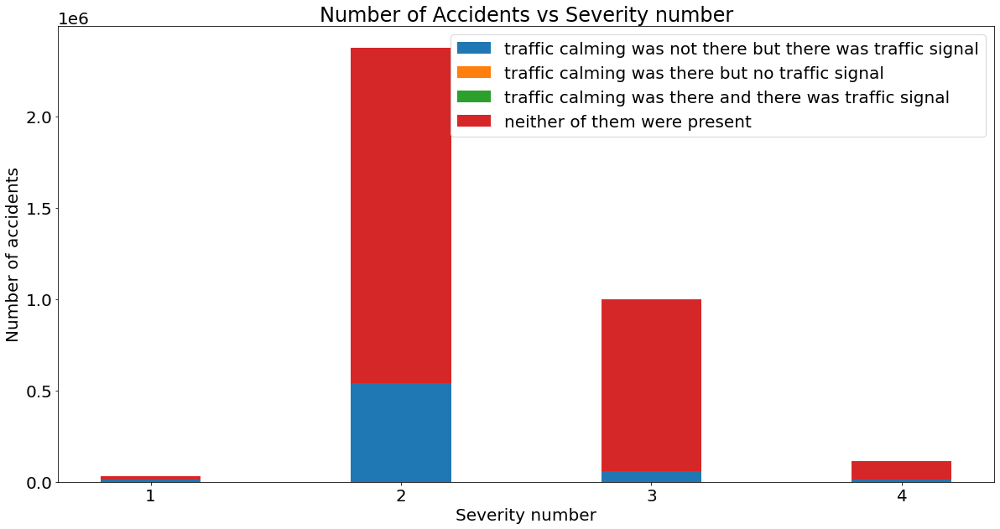

In [ ]:
stacked_data=[]
for i in range(4):
    temp=[0,0,0,0]
    stacked_data.append(temp)
    
for i in df.index:
    if df.loc[i,'Severity']>=1 and df.loc[i,'Severity']<=4:
        if str(df.loc[i,'Traffic_Calming'])=='False' and str(df.loc[i,'Traffic_Signal'])=='True':
            stacked_data[0][df.loc[i,'Severity']-1]+=1
        elif str(df.loc[i,'Traffic_Calming'])=='True' and str(df.loc[i,'Traffic_Signal'])=='False':
            stacked_data[1][df.loc[i,'Severity']-1]+=1
        elif str(df.loc[i,'Traffic_Calming'])=='True' and str(df.loc[i,'Traffic_Signal'])=='True':
            stacked_data[2][df.loc[i,'Severity']-1]+=1
        else:
            stacked_data[3][df.loc[i,'Severity']-1]+=1

x=['1','2','3','4']
plt.bar(x,stacked_data[0],0.4,label="traffic calming was not there but there was traffic signal")
plt.bar(x,stacked_data[1],0.4,bottom=stacked_data[0],label="traffic calming was there but no traffic signal")
bottom_1=list(np.add(stacked_data[0],stacked_data[1]))
plt.bar(x,stacked_data[2],0.4,bottom=bottom_1,label="traffic calming was there and there was traffic signal")
bottom_2=list(np.add(bottom_1,stacked_data[2]))
plt.bar(x,stacked_data[3],0.4,bottom=bottom_2,label="neither of them were present")
plt.rcParams["figure.figsize"] = (15, 8)
plt.title("Number of Accidents vs Severity number")
plt.xlabel("Severity number")
plt.ylabel("Number of accidents")
plt.legend()
plt.show()

In [ ]:
words=''
for item in df['Description']:
    words+=' ' +str(item)
stopwords = set(STOPWORDS)
words=words.upper()

In [ ]:
wordcloud = WordCloud(max_words=2000, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size =5).generate(words) 

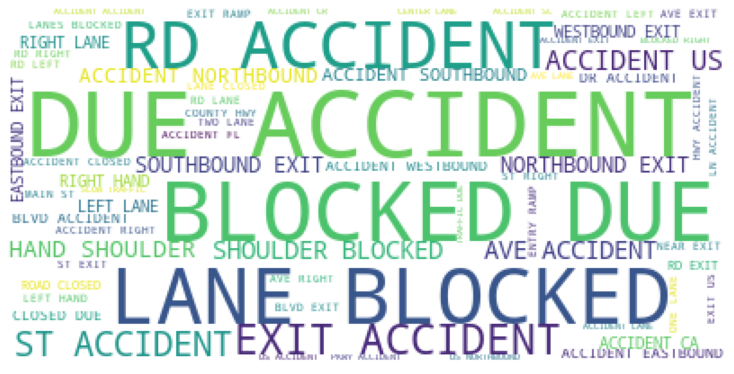

In [ ]:
# plot the WordCloud image                        
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.show()

In [ ]:
state_count_acc = pd.value_counts(df['State'])

fig = go.Figure(data=go.Choropleth(
    locations=state_count_acc.index,
    z = state_count_acc.values.astype(float),
    locationmode = 'USA-states',
    colorscale = 'Reds',
    colorbar_title = "Count Accidents",
))

fig.update_layout(
    title_text = '2016 - 2019 US Traffic Accident Dataset by State',
    geo_scope='usa',
)

fig.show()

In [ ]:
df1 = df
import plotly.graph_objects as go
from geopy.geocoders import Nominatim
cities = {}
state = []
lat_1 = []
lon_1 = []
for ind in df1.index:
    city = df1['City'][ind]
    state_1 = df1['State'][ind]
    if city in cities:
        cities[city] +=1
    else:
        cities[city] = 1
        state.append(state_1)
        lat_1.append(df1['Start_Lat'][ind])
        lon_1.append(df1['Start_Lng'][ind])


In [ ]:
city_count = []
city_name = []
for city in cities:
    city_count.append(cities[city])
    city_name.append(city)
 
data1 = {'City':city_name}
data = pd.DataFrame(data1)  
data['State']= state
data['Accident_count'] = city_count
data['Longitude'] = lon_1
data['Latitude'] = lat_1
# Observe the result  
data

,City,State,Accident_count,Longitude,Latitude
0,Dayton,OH,14251,-84.058723,39.865147
1,Reynoldsburg,OH,257,-82.831184,39.928059
2,Williamsburg,OH,830,-84.032608,39.063148
3,Westerville,OH,752,-82.925194,40.100590
4,Columbus,OH,13299,-83.119293,39.952812
...,...,...,...,...,...
11891,Ness City,KS,1,-99.905040,38.452820
11892,Addy,WA,1,-117.836463,48.363795
11893,Paron,AR,1,-92.765265,34.760189
11894,Clarksdale,MS,1,-90.541320,34.172360


In [ ]:
root = []
acc = []
for i in data.index:
    root.append(math.sqrt(data['Accident_count'][i])/10)
    acc.append(str(data['City'][i])+', Accidents: '+ str(data['Accident_count'][i]))
print(root,acc)

[11.937755232873558, 1.6031219541881399, 2.8809720581775866, 2.7422618401604177, 11.532129031536197, 3.426368339802363, 2.6229754097208002, 4.525483399593904, 1.4798648586948742, 4.0087404505654884, 0.3, 1.396424004376894, 1.6763054614240211, 0.9797958971132712, 0.6782329983125268, 0.5744562646538028, 4.154515615568198, 1.4106735979665885, 2.5199206336708304, 1.044030650891055, 1.0392304845413265, 0.7937253933193772, 0.41231056256176607, 1.8303005217723125, 1.3928388277184118, 1.2806248474865698, 4.916299421312742, 1.760681686165901, 7.991870869827665, 1.0770329614269007, 1.044030650891055, 0.7348469228349535, 0.2449489742783178, 3.872983346207417, 6.198386886924694, 0.99498743710662, 1.466287829861518, 0.8062257748298549, 0.1, 1.1489125293076057, 0.469041575982343, 0.7681145747868607, 0.223606797749979, 2.3, 1.014889156509222, 1.0862780491200215, 1.3266499161421599, 5.3065996645686395, 0.8306623862918074, 0.6324555320336759, 0.9219544457292888, 0.7874007874011811, 1.5842979517754858, 

In [ ]:
fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = data['Longitude'],
        lat = data['Latitude'],
        text = acc,
        mode = 'markers',
        marker = dict(
            size = root,#data['Accident_count']/sum(data['Accident_count']),
            opacity = 0.8,
            reversescale = True,
            autocolorscale = True,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(255,0,0)'
            ),
           
        )))

fig.update_layout(
        title = 'Accidents in Cities',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(255,218,185)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.7,
            subunitwidth = 0.7
        ),
    )
fig.show()


In [ ]:
data_sever = df.sample(n=100000)[['Start_Lng','Start_Lat','City','Visibility(mi)','Severity']]
data_sever.dropna(inplace=True)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = data_sever['Start_Lng'],
        lat = data_sever['Start_Lat'],
        text = data_sever['City'],
        mode = 'markers',
        marker = dict(
            size = data_sever['Visibility(mi)'],
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Blues',
            cmin = data_sever['Severity'].max(),
        color = data_sever['Severity'],
        cmax = 1,
            colorbar_title="Severity"
        )))

fig.update_layout(
        title = 'Severity & Visibility of accidents',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(211,211,211)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.7,
            subunitwidth = 0.7
        ),
    )
fig.show()

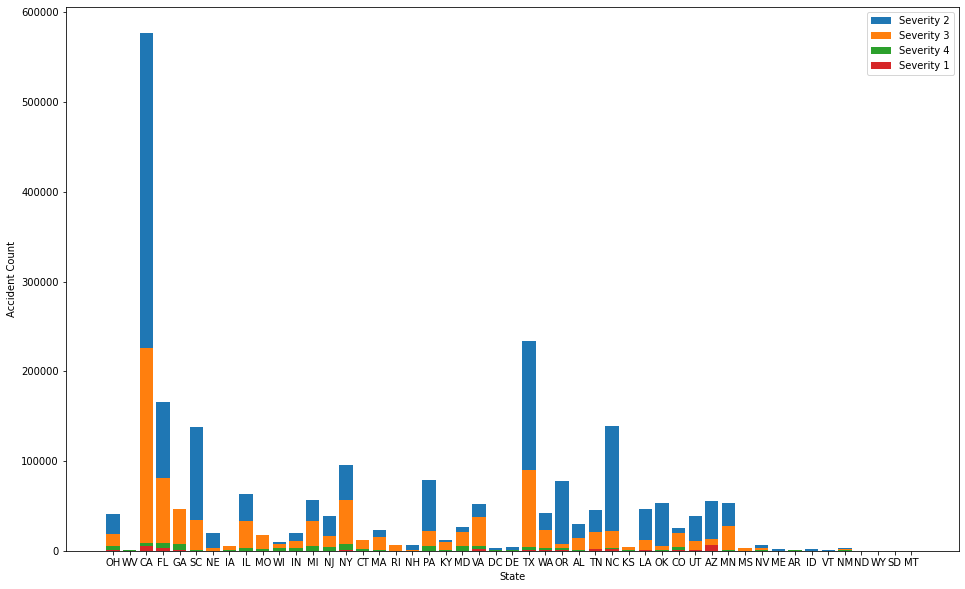

In [ ]:
plt.figure(figsize=(16,10))
states = df['State'].unique()
severity_1_by_state = []
severity_2_by_state = []
severity_3_by_state = []
severity_4_by_state = []

for i in states:
    severity_1_by_state.append(df[(df['Severity']==1)&(df['State']==i)].count()['ID'])
    severity_2_by_state.append(df[(df['Severity']==2)&(df['State']==i)].count()['ID'])
    severity_3_by_state.append(df[(df['Severity']==3)&(df['State']==i)].count()['ID'])
    severity_4_by_state.append(df[(df['Severity']==4)&(df['State']==i)].count()['ID'])

    
plt.bar(states, severity_2_by_state, label='Severity 2')
plt.bar(states, severity_3_by_state, label='Severity 3')
plt.bar(states, severity_4_by_state, label='Severity 4')
plt.bar(states, severity_1_by_state, label='Severity 1')
plt.xlabel('State')
plt.ylabel('Accident Count')
plt.legend()

In [ ]:
data_sever = df.sample(n=100000)[['Start_Lng','Start_Lat','City','Visibility(mi)','Severity']]
data_sever.dropna(inplace=True)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = data_sever['Start_Lng'],
        lat = data_sever['Start_Lat'],
        text = data_sever['City'],
        mode = 'markers',
        marker = dict(
            size = data_sever['Visibility(mi)'],
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Blues',
            cmin = data_sever['Severity'].max(),
        color = data_sever['Severity'],
        cmax = 1,
            colorbar_title="Severity"
        )))

fig.update_layout(
        title = 'Severity & Visibility of accidents',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(211,211,211)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.7,
            subunitwidth = 0.7
        ),
    )
fig.show()

In [ ]:
data_sever = df.sample(n=100000)[['Start_Lng','Start_Lat','City','Visibility(mi)','Severity']]
data_sever.dropna(inplace=True)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = data_sever['Start_Lng'],
        lat = data_sever['Start_Lat'],
        text = data_sever['City'],
        mode = 'markers',
        marker = dict(
            size = data_sever['Visibility(mi)'],
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Blues',
            cmin = data_sever['Severity'].max(),
        color = data_sever['Severity'],
        cmax = 1,
            colorbar_title="Severity"
        )))

fig.update_layout(
        title = 'Severity & Visibility of accidents',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(211,211,211)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.7,
            subunitwidth = 0.7
        ),
    )
fig.show()

In [ ]:
df['Start_Time']= pd.to_datetime(df['Start_Time'])
df['hour']= df['Start_Time'].dt.hour
df['year']= df['Start_Time'].dt.year
df['month']= df['Start_Time'].dt.month
df['week']= df['Start_Time'].dt.week
df['day']= df['Start_Time'].dt.day_name()
df['quarter']= df['Start_Time'].dt.quarter
df['time_zone']= df['Start_Time'].dt.tz
df['time']= df['Start_Time'].dt.time

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



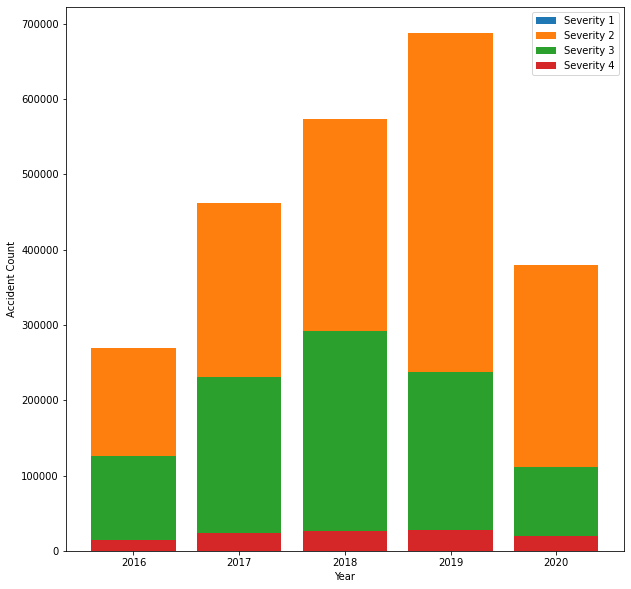

In [ ]:
#plt.figure(figsize =(10,5))
#df.groupby(['year']).size().sort_values(ascending=True).plot.bar()
years = df.year.unique()

count_by_year=[]
for i in df.year.unique():
    count_by_year.append(df[df['year']==2016].count()['ID'])
    

for i in df.year.unique():
    count_by_year.append(df[df['year']==2017].count()['ID'])

for i in df.year.unique():
    count_by_year.append(df[df['year']==2018].count()['ID'])

for i in df.year.unique():
    count_by_year.append(df[df['year']==2019].count()['ID'])
    
for i in df.year.unique():
    count_by_year.append(df[df['year']==2020].count()['ID'])



severity_1_by_year = []
severity_2_by_year = []
severity_3_by_year = []
severity_4_by_year = []
for i in years:
    severity_1_by_year.append(df[(df['Severity']==1)&(df['year']==i)].count()['ID'])
    severity_2_by_year.append(df[(df['Severity']==2)&(df['year']==i)].count()['ID'])
    severity_3_by_year.append(df[(df['Severity']==3)&(df['year']==i)].count()['ID'])
    severity_4_by_year.append(df[(df['Severity']==4)&(df['year']==i)].count()['ID'])

plt.figure(figsize=(10,10))
plt.bar(years, severity_1_by_year, label='Severity 1')
plt.bar(years, severity_2_by_year, label='Severity 2')
plt.bar(years, severity_3_by_year, label='Severity 3')
plt.bar(years, severity_4_by_year, label='Severity 4')

plt.xlabel('Year')
plt.ylabel('Accident Count')

plt.legend()
    

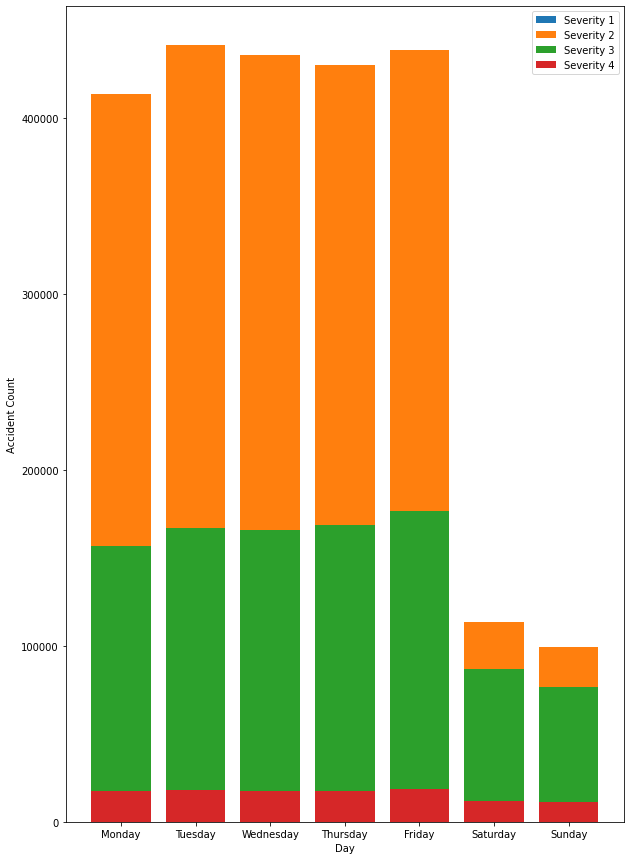

In [ ]:
#df.groupby(['day']).size().plot.bar()

days = df.day.unique()

count_by_day=[]
for i in df.day.unique():
    count_by_day.append(df[df['day']=='Sunday'].count()['ID'])
    

for i in df.day.unique():
    count_by_day.append(df[df['day']=='Monday'].count()['ID'])

for i in df.day.unique():
    count_by_day.append(df[df['day']=='Tuesday'].count()['ID'])

for i in df.day.unique():
    count_by_day.append(df[df['day']=='Wednesday'].count()['ID'])
    
for i in df.day.unique():
    count_by_day.append(df[df['day']=='Thursday'].count()['ID'])

for i in df.day.unique():
    count_by_day.append(df[df['day']=='Friday'].count()['ID'])

for i in df.day.unique():
    count_by_day.append(df[df['day']=='Saturday'].count()['ID'])



severity_1_by_day = []
severity_2_by_day = []
severity_3_by_day = []
severity_4_by_day = []
for i in days:
    severity_1_by_day.append(df[(df['Severity']==1)&(df['day']==i)].count()['ID'])
    severity_2_by_day.append(df[(df['Severity']==2)&(df['day']==i)].count()['ID'])
    severity_3_by_day.append(df[(df['Severity']==3)&(df['day']==i)].count()['ID'])
    severity_4_by_day.append(df[(df['Severity']==4)&(df['day']==i)].count()['ID'])

plt.figure(figsize=(10,15))
plt.bar(days, severity_1_by_day, label='Severity 1')
plt.bar(days, severity_2_by_day, label='Severity 2')
plt.bar(days, severity_3_by_day, label='Severity 3')
plt.bar(days, severity_4_by_day, label='Severity 4')

plt.xlabel('Day')
plt.ylabel('Accident Count')

plt.legend()